In [1]:
import os
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import cv2 
import tensorflow as tf
import random
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report , confusion_matrix

from tqdm import tqdm
from keras.layers import Conv2D, MaxPooling2D , BatchNormalization ,Dropout ,Flatten , Dense , Input
from tensorflow.keras.applications import VGG16
from keras.models import Sequential

import warnings

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    
plt.style.use('ggplot')

In [2]:
dataDir = 'datasets\corn'
selectedClasses = ['Blight',
                   'Common_Rust',
                   'Gray_Leaf_Spot',
                   'Healthy',]

In [3]:
imgPaths = []
labels = []
for className in os.listdir(dataDir):
    if className in selectedClasses :                  
        classPath = os.path.join(dataDir,className)
        for img in os.listdir(classPath):
            imgPath = os.path.join(classPath,img)
            imgPaths.append(imgPath)
            labels.append(className)
            

df = pd.DataFrame({
    'imgPath':imgPaths,
    'label':labels
})

df = df.sample(frac=1).reset_index(drop=True)           

df

,imgPath,label
0,datasets\corn\Healthy\Corn_Health (522).jpg,Healthy
1,datasets\corn\Blight\Corn_Blight (458).JPG,Blight
2,datasets\corn\Common_Rust\Corn_Common_Rust (60...,Common_Rust
3,datasets\corn\Common_Rust\Corn_Common_Rust (38...,Common_Rust
4,datasets\corn\Common_Rust\Corn_Common_Rust (68...,Common_Rust
...,...,...
4183,datasets\corn\Gray_Leaf_Spot\Corn_Gray_Spot (5...,Gray_Leaf_Spot
4184,datasets\corn\Healthy\Corn_Health (1024).jpg,Healthy
4185,datasets\corn\Blight\Corn_Blight (23).jpg,Blight
4186,datasets\corn\Common_Rust\Corn_Common_Rust (31...,Common_Rust


In [4]:
len(df)

4188

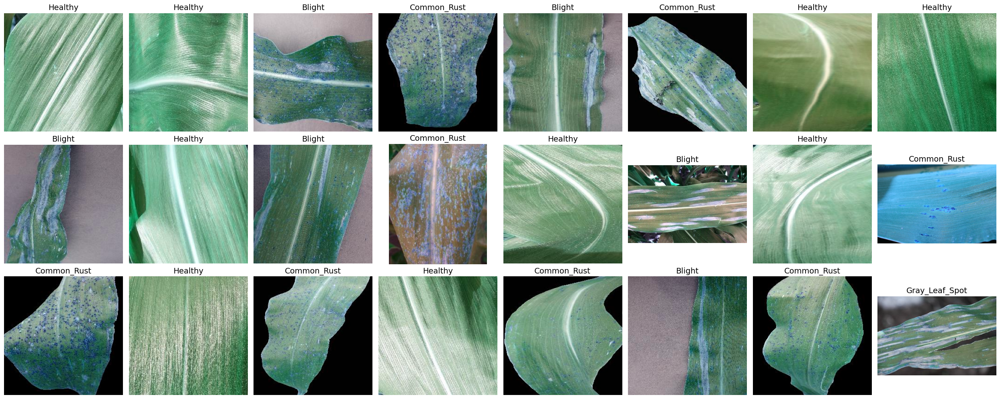

In [5]:
fig, axs = plt.subplots(3, 8, figsize=(25, 10))  # 3 rows, 5 columns

axs = axs.flatten()

for i in range(24):
    index = random.choice(df.index)
    imgPath = df.iloc[index]['imgPath']
    label = df.iloc[index]['label']
    img = cv2.imread(imgPath)
    axs[i].imshow(img)
    axs[i].set_title(label , fontsize=14)
    axs[i].axis('off')
    
plt.tight_layout()
plt.show()

In [6]:
df['label'] = df['label'].replace({'Healthy':0,
                                    'Blight':1,
                                    'Common_Rust':2,
                                    'Gray_Leaf_Spot':3,
                                    }).astype(int)

C:\Users\sarth\AppData\Local\Temp\ipykernel_17152\3039152269.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['label'] = df['label'].replace({'Healthy':0,


In [7]:
IMG_SIZE = (150,150)   # to free some resources and reduce the execution time
imgs = []
for imgPath in tqdm(df['imgPath'], total=len(df)):
    img = cv2.imread(imgPath)
    img = cv2.cvtColor(img , cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, IMG_SIZE)
    imgs.append(img)

100%|██████████| 4188/4188 [00:09<00:00, 440.33it/s]


In [8]:
# convert them to numpy array to we can split them 
images = np.array(imgs)
labels = np.array(df['label'])

len(images) , len(labels)

(4188, 4188)

In [9]:
images = images / 255.0         # normalize from 0 --> 255 to 0 --> 1  to reduce the execution time 

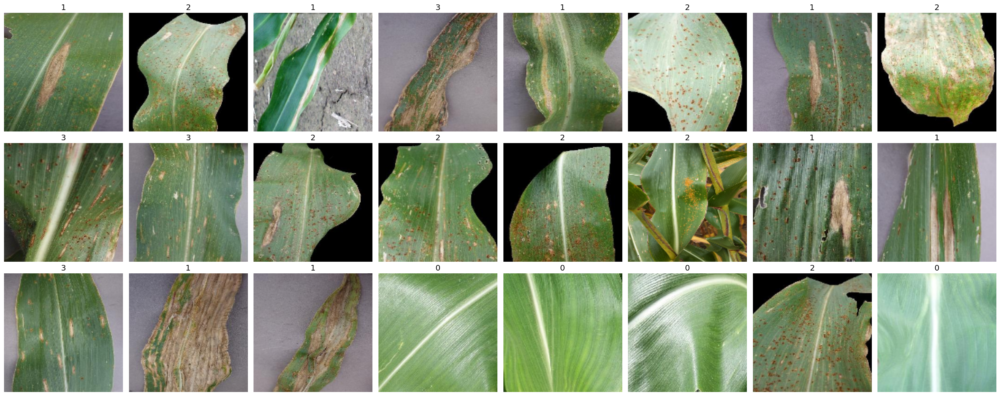

In [10]:
# Plot some images after encoding and resizing 
fig, axs = plt.subplots(3, 8, figsize=(25, 10))

axs = axs.flatten()

for i in range(24):
    index = random.choice(df.index)
    img = images[index]
    label = labels[index]
    axs[i].imshow(img)
    axs[i].set_title(label, fontsize=14)
    axs[i].axis('off')
    

plt.tight_layout()
plt.show()

In [11]:
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42 ,shuffle=True)

print(f'Shape of X_train : {X_train.shape}')
print(f'Shape of X_test : {X_test.shape}')
print(f'Shape of y_train : {y_train.shape}')
print(f'Shape of y_test : {y_test.shape}')

Shape of X_train : (3350, 150, 150, 3)
Shape of X_test : (838, 150, 150, 3)
Shape of y_train : (3350,)
Shape of y_test : (838,)


In [12]:
with tf.device('/GPU:0'):
    kerasModel = Sequential([
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID' ,input_shape=(150,150,3)), # padding ='SAME' for using padding
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),

        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),

        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        Flatten(),

        Dense(128,activation='relu'),
        Dense(6 ,activation='softmax')
    ])

c:\Users\sarth\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [13]:
kerasModel.compile(optimizer='adam',loss='sparse_categorical_crossentropy' ,metrics=['accuracy'])

In [14]:
history = kerasModel.fit(X_train,y_train,
                         validation_split = 0.2 , #validation_data=(X_test,y_test),
                         epochs=10,
                         batch_size=50, 
                         verbose=1,
                         callbacks=[tf.keras.callbacks.EarlyStopping(
                                            patience=5,
                                            monitor='val_accuracy',
                                            restore_best_weights=True)])

Epoch 1/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 27s 428ms/step - accuracy: 0.6517 - loss: 0.9385 - val_accuracy: 0.4522 - val_loss: 1.1490
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 22s 396ms/step - accuracy: 0.8075 - loss: 0.4883 - val_accuracy: 0.2881 - val_loss: 2.3163
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 22s 397ms/step - accuracy: 0.8442 - loss: 0.4050 - val_accuracy: 0.4269 - val_loss: 1.6455
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 21s 396ms/step - accuracy: 0.8754 - loss: 0.3287 - val_accuracy: 0.2746 - val_loss: 2.7860
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 22s 402ms/step - accuracy: 0.8668 - loss: 0.3252 - val_accuracy: 0.2731 - val_loss: 2.9656
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 21s 393ms/step - accuracy: 0.8908 - loss: 0.2779 - val_accuracy: 0.4045 - val_loss: 1.5115


In [15]:
y_pred = kerasModel.predict(X_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step


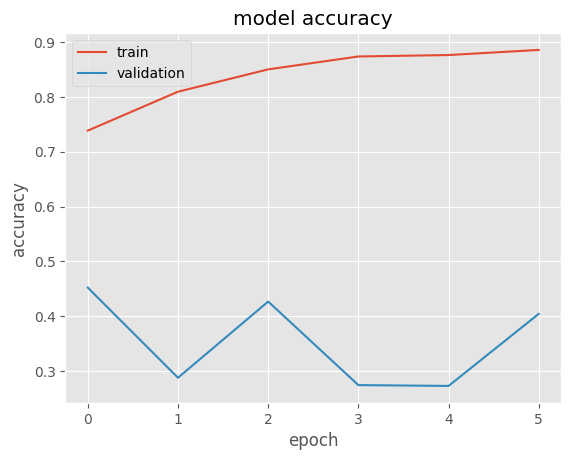

In [16]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [17]:
y_test[:10]

array([0, 1, 1, 2, 2, 0, 3, 3, 2, 2])

In [18]:
new_y_pred = [np.argmax(x) for x in y_pred]
new_y_pred[:10]

[0, 1, 0, 1, 0, 0, 0, 0, 0, 0]

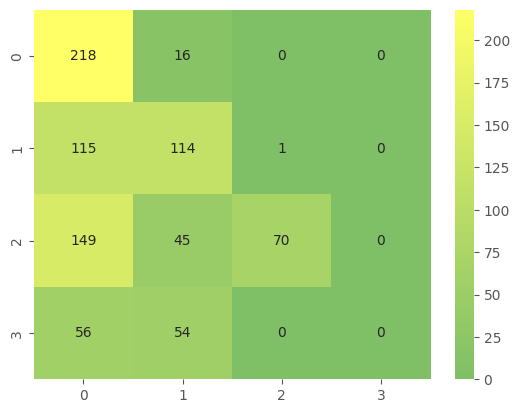

In [19]:
CM = confusion_matrix(y_test, new_y_pred)
sns.heatmap(CM, center = True,cmap='summer',annot=True ,fmt='.5g')
plt.show()

In [20]:
ClassificationReport = classification_report(y_test,new_y_pred)
print('Classification Report is : \n', ClassificationReport )

Classification Report is : 
               precision    recall  f1-score   support

           0       0.41      0.93      0.56       234
           1       0.50      0.50      0.50       230
           2       0.99      0.27      0.42       264
           3       0.00      0.00      0.00       110

    accuracy                           0.48       838
   macro avg       0.47      0.42      0.37       838
weighted avg       0.56      0.48      0.43       838



c:\Users\sarth\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\sarth\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\sarth\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

In [21]:
custom_input = Input(shape=(150, 150, 3))           # To customize the input shape of PreTrained model  

with tf.device('/GPU:0'):          # to use GPU
    Model = Sequential([

        VGG16(weights='imagenet', include_top=False, input_tensor=custom_input),
        
        Flatten(),                                     # because we ignore the flatten and dense layers when include_top = False 
        
        Dense(128,activation='relu'),
        
        Dropout(0.2),

        Dense(6 ,activation='softmax')
    ])

In [22]:
VGG16Layers = Model.layers[0]
for layer in VGG16Layers.layers[1:-3]:           # freez all layers except the first and last 3 layers, we will make them trainable (weghts changes with training)
    layer.trainable = False

In [23]:
Model.compile(optimizer='adam',loss='sparse_categorical_crossentropy' ,metrics=['accuracy'])

In [24]:
history = Model.fit(X_train,y_train,
                         validation_split = 0.2 , #validation_data=(X_test,y_test),
                         epochs=10,
                         batch_size=100, 
                         verbose=1,
                         callbacks=[tf.keras.callbacks.EarlyStopping(
                                            patience=5,
                                            monitor='val_accuracy',
                                            restore_best_weights=True)])

Epoch 1/10


c:\Users\sarth\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\models\functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor_24']. Received: the structure of inputs=*
  warnings.warn(


27/27 ━━━━━━━━━━━━━━━━━━━━ 114s 4s/step - accuracy: 0.4449 - loss: 1.4827 - val_accuracy: 0.8164 - val_loss: 0.4912
Epoch 2/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 109s 4s/step - accuracy: 0.8435 - loss: 0.4070 - val_accuracy: 0.8731 - val_loss: 0.3042
Epoch 3/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 110s 4s/step - accuracy: 0.8989 - loss: 0.2716 - val_accuracy: 0.8970 - val_loss: 0.2592
Epoch 4/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 108s 4s/step - accuracy: 0.9272 - loss: 0.2079 - val_accuracy: 0.8985 - val_loss: 0.2561
Epoch 5/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 108s 4s/step - accuracy: 0.9313 - loss: 0.1613 - val_accuracy: 0.9090 - val_loss: 0.2771
Epoch 6/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 108s 4s/step - accuracy: 0.9510 - loss: 0.1318 - val_accuracy: 0.9045 - val_loss: 0.2581
Epoch 7/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 108s 4s/step - accuracy: 0.9533 - loss: 0.1150 - val_accuracy: 0.8955 - val_loss: 0.3236
Epoch 8/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 108s 4s/step - accuracy: 0.9734 - loss: 0.0878 - val_accuracy: 0.9134 - val_loss: 0.

In [25]:
Model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 27,302,356 (104.15 MB)

 Trainable params: 5,769,094 (22.01 MB)

 Non-trainable params: 9,995,072 (38.13 MB)

 Optimizer params: 11,538,190 (44.01 MB)

In [26]:
y_pred = Model.predict(X_test)

27/27 ━━━━━━━━━━━━━━━━━━━━ 25s 914ms/step


In [27]:
print(f'Prediction items : \n{y_pred[:5]}')

Prediction items : 
[[9.9980360e-01 1.7233555e-04 1.9461164e-05 4.0395539e-06 4.9951834e-09
  6.7023007e-07]
 [5.3702865e-04 3.3729690e-01 1.6195441e-03 6.6049832e-01 4.7012920e-05
  1.2028446e-06]
 [8.8355191e-11 1.0000000e+00 2.2428719e-10 4.3818771e-09 8.8013308e-17
  5.9336416e-18]
 [4.6843140e-16 3.0685334e-09 1.0000000e+00 7.1360535e-16 1.6810831e-18
  4.3932033e-19]
 [5.9760661e-21 2.5111497e-18 1.0000000e+00 9.6646082e-23 1.0076233e-24
  8.6495253e-24]]


In [28]:
print(f'Prediction items after rounding :  \n{np.round(y_pred[:5])}')

Prediction items after rounding :  
[[1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0.]
 [0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0.]]


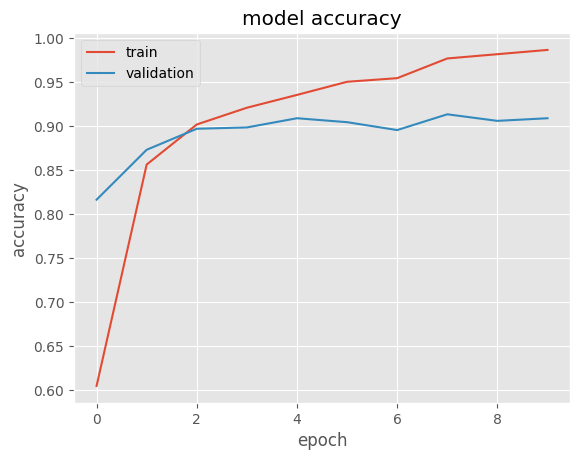

In [29]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [30]:
y_test[:10]

array([0, 1, 1, 2, 2, 0, 3, 3, 2, 2])

In [31]:
new_y_pred = [np.argmax(x) for x in y_pred]
new_y_pred[:10]

[0, 3, 1, 2, 2, 0, 1, 1, 2, 2]

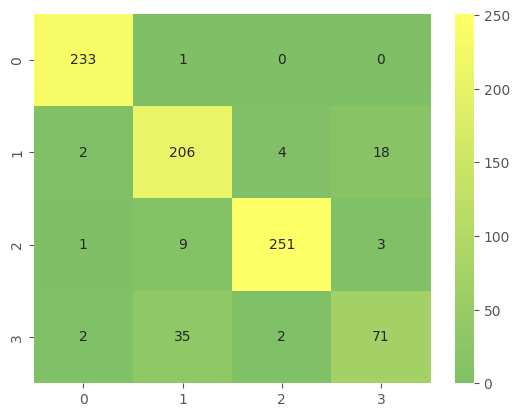

In [32]:
CM = confusion_matrix(y_test, new_y_pred)
sns.heatmap(CM, center = True,cmap='summer',annot=True ,fmt='.5g')
plt.show()

In [33]:
ClassificationReport = classification_report(y_test,new_y_pred)
print('Classification Report is : \n', ClassificationReport )

Classification Report is : 
               precision    recall  f1-score   support

           0       0.98      1.00      0.99       234
           1       0.82      0.90      0.86       230
           2       0.98      0.95      0.96       264
           3       0.77      0.65      0.70       110

    accuracy                           0.91       838
   macro avg       0.89      0.87      0.88       838
weighted avg       0.91      0.91      0.91       838



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


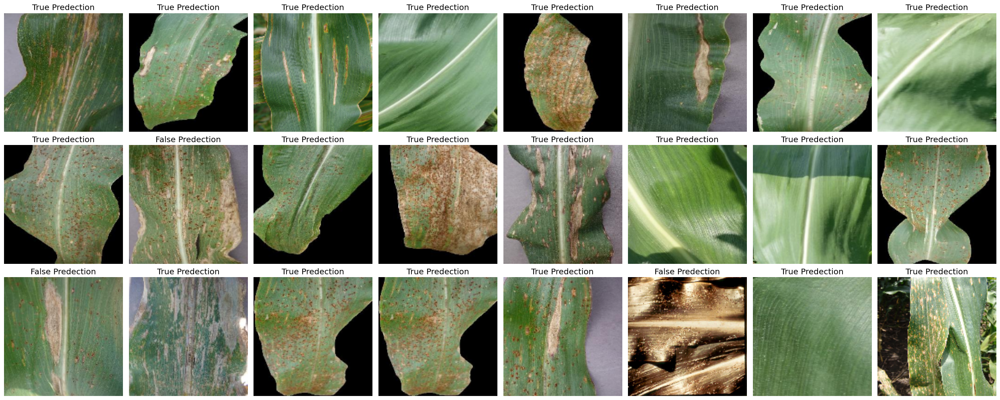

In [34]:
# Plot some images after encoding and resizing 
fig, axs = plt.subplots(3, 8, figsize=(25, 10))

axs = axs.flatten()

for i in range(24):
    index = random.choice(range(len(X_test)))
    img = X_test[index]
    label = y_test[index]
    reshapedImg = img.reshape(1,150,150,3)
    pred = np.argmax(Model.predict(reshapedImg))
    isPredectedTrue = 'True' if (label == pred) else 'False'
    axs[i].imshow(img)
    axs[i].set_title(f'{isPredectedTrue} Predection')
    axs[i].axis('off')
    
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)
plt.show()